In [1]:
import pandas as pd

# Cargar los datos
conflictsData = pd.read_csv('../docs/ucdp_data_conflicts_2000_2024.csv', low_memory=False)
eventsData = pd.read_csv('../docs/ucdp_data_events_2000_2024.csv', low_memory=False)

# Realizar el right join usando 'conflict_id' en conflictsData y 'conflict_dset_id' en eventsData
mergedData = pd.merge(conflictsData, eventsData, left_on='conflict_id', right_on='conflict_dset_id', how='right', suffixes=('', '_right'))

# Identificar las columnas duplicadas de la derecha (con el sufijo '_right')
columns_to_drop = [col for col in mergedData.columns if col.endswith('_right')]

# Eliminar las columnas duplicadas de la derecha
data = mergedData.drop(columns=columns_to_drop)

# Mostrar las primeras filas del DataFrame resultante para verificar el resultado
data.head()


,conflict_id,location,side_a,side_a_Id,side_a_2nd,side_b,side_b_Id,side_b_2nd,incompatibility,territory_name,...,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,best,high,low,gwnoa,gwnob
0,230.0,Yemen (North Yemen),Government of Yemen (North Yemen),123,NaN,Opposition coalition,197,NaN,2.0,NaN,...,2010-09-25T00:00:00,2,0,0,0,2,2,2,678,NaN
1,230.0,Yemen (North Yemen),Government of Yemen (North Yemen),123,Government of Egypt,Royalists,198,NaN,2.0,NaN,...,2010-09-25T00:00:00,2,0,0,0,2,2,2,678,NaN
2,230.0,Yemen (North Yemen),Government of Yemen (North Yemen),123,Government of Egypt,Royalists,198,NaN,2.0,NaN,...,2010-09-25T00:00:00,2,0,0,0,2,2,2,678,NaN
3,230.0,Yemen (North Yemen),Government of Yemen (North Yemen),123,Government of Egypt,Royalists,198,NaN,2.0,NaN,...,2010-09-25T00:00:00,2,0,0,0,2,2,2,678,NaN
4,230.0,Yemen (North Yemen),Government of Yemen (North Yemen),123,Government of Egypt,Royalists,198,NaN,2.0,NaN,...,2010-09-25T00:00:00,2,0,0,0,2,2,2,678,NaN


In [3]:
data.shape

(5578612, 73)

In [4]:
data.columns

Index(['conflict_id', 'location', 'side_a', 'side_a_Id', 'side_a_2nd',
       'side_b', 'side_b_Id', 'side_b_2nd', 'incompatibility',
       'territory_name', 'year', 'intensity_level', 'cumulative_intensity',
       'type_of_conflict', 'start_date', 'start_prec', 'start_date2',
       'start_prec2', 'ep_end', 'ep_end_date', 'ep_end_prec', 'gwno_a',
       'gwno_a_2nd', 'gwno_b', 'gwno_b_2nd', 'gwno_loc', 'region', 'version',
       'id', 'relid', 'active_year', 'code_status', 'type_of_violence',
       'conflict_dset_id', 'conflict_new_id', 'conflict_name', 'dyad_dset_id',
       'dyad_new_id', 'dyad_name', 'side_a_dset_id', 'side_a_new_id',
       'side_b_dset_id', 'side_b_new_id', 'number_of_sources',
       'source_article', 'source_office', 'source_date', 'source_headline',
       'source_original', 'where_prec', 'where_coordinates',
       'where_description', 'adm_1', 'adm_2', 'latitude', 'longitude',
       'geom_wkt', 'priogrid_gid', 'country', 'country_id', 'event_clarity',
 

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5578612 entries, 0 to 5578611
Data columns (total 73 columns):
 #   Column                Dtype  
---  ------                -----  
 0   conflict_id           float64
 1   location              object 
 2   side_a                object 
 3   side_a_Id             object 
 4   side_a_2nd            object 
 5   side_b                object 
 6   side_b_Id             object 
 7   side_b_2nd            object 
 8   incompatibility       float64
 9   territory_name        object 
 10  year                  float64
 11  intensity_level       float64
 12  cumulative_intensity  float64
 13  type_of_conflict      float64
 14  start_date            object 
 15  start_prec            float64
 16  start_date2           object 
 17  start_prec2           float64
 18  ep_end                float64
 19  ep_end_date           object 
 20  ep_end_prec           float64
 21  gwno_a                object 
 22  gwno_a_2nd            object 
 23  gwno_b 

In [6]:
datos = data.sort_values(by='date_start', ascending=True)

datos.columns

In [33]:
datos.describe()

,conflict_id,incompatibility,year,intensity_level,cumulative_intensity,type_of_conflict,start_prec,start_prec2,ep_end,ep_end_prec,...,event_clarity,date_prec,deaths_a,deaths_b,deaths_civilians,deaths_unknown,best,high,low,gwnob
count,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,0.0,...,5.578612e+06,5.578612e+06,5.578612e+06,5.578612e+06,5.578612e+06,5.578612e+06,5.578612e+06,5.578612e+06,5.578612e+06,27725.000000
mean,6.712921e+02,1.750931e+00,1.999114e+03,1.525420e+00,8.890771e-01,3.378281e+00,2.923012e+00,1.765493e+00,6.694278e-02,NaN,...,1.090339e+00,1.192493e+00,1.437049e+00,2.738071e+00,1.154060e+00,9.345819e-01,6.263762e+00,7.919554e+00,5.926945e+00,699.863192
std,2.155841e+03,4.345621e-01,1.781678e+01,4.993534e-01,3.140367e-01,4.962111e-01,2.287665e+00,1.452775e+00,2.499229e-01,NaN,...,2.866668e-01,5.171911e-01,4.263440e+01,1.982007e+01,8.527586e+00,1.535711e+02,1.630322e+02,1.689432e+02,1.629762e+02,149.442258
min,2.050000e+02,1.000000e+00,1.946000e+03,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,NaN,...,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,369.000000
25%,2.890000e+02,2.000000e+00,1.986000e+03,1.000000e+00,1.000000e+00,3.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,NaN,...,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,770.000000
50%,3.090000e+02,2.000000e+00,2.003000e+03,2.000000e+00,1.000000e+00,3.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,NaN,...,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,3.000000e+00,2.000000e+00,770.000000
75%,3.330000e+02,2.000000e+00,2.014000e+03,2.000000e+00,1.000000e+00,4.000000e+00,6.000000e+00,1.000000e+00,0.000000e+00,NaN,...,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,0.000000e+00,0.000000e+00,5.000000e+00,6.000000e+00,5.000000e+00,770.000000
max,1.543800e+04,3.000000e+00,2.022000e+03,2.000000e+00,1.000000e+00,4.000000e+00,6.000000e+00,6.000000e+00,1.000000e+00,NaN,...,2.000000e+00,5.000000e+00,1.416200e+04,6.916000e+03,5.964000e+03,7.534000e+04,7.534000e+04,7.425600e+04,7.548200e+04,800.000000


In [7]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5578612 entries, 463999 to 5544561
Data columns (total 73 columns):
 #   Column                Dtype  
---  ------                -----  
 0   conflict_id           float64
 1   location              object 
 2   side_a                object 
 3   side_a_Id             object 
 4   side_a_2nd            object 
 5   side_b                object 
 6   side_b_Id             object 
 7   side_b_2nd            object 
 8   incompatibility       float64
 9   territory_name        object 
 10  year                  float64
 11  intensity_level       float64
 12  cumulative_intensity  float64
 13  type_of_conflict      float64
 14  start_date            object 
 15  start_prec            float64
 16  start_date2           object 
 17  start_prec2           float64
 18  ep_end                float64
 19  ep_end_date           object 
 20  ep_end_prec           float64
 21  gwno_a                object 
 22  gwno_a_2nd            object 
 23  gwno_b 

In [8]:
datos.isna()

,conflict_id,location,side_a,side_a_Id,side_a_2nd,side_b,side_b_Id,side_b_2nd,incompatibility,territory_name,...,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,best,high,low,gwnoa,gwnob
463999,False,False,False,False,True,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,True
445976,False,False,False,False,True,False,False,True,False,True,...,False,False,False,False,False,False,False,False,False,True
445975,False,False,False,False,True,False,False,True,False,True,...,False,False,False,False,False,False,False,False,False,True
445974,False,False,False,False,True,False,False,True,False,True,...,False,False,False,False,False,False,False,False,False,True
459481,False,False,False,False,True,False,False,True,False,False,...,False,False,False,False,False,False,False,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5546958,False,False,False,False,True,False,False,True,False,True,...,False,False,False,False,False,False,False,False,False,True
5546959,False,False,False,False,True,False,False,True,False,True,...,False,False,False,False,False,False,False,False,False,True
5546904,False,False,False,False,True,False,False,True,False,True,...,False,False,False,False,False,False,False,False,False,True
5544924,False,False,False,False,False,False,False,True,False,True,...,False,False,False,False,False,False,False,False,False,True


In [9]:
# Extract year from the date_start column
datos['year'] = pd.to_datetime(datos['date_start']).dt.year

# Define a dictionary to store yearly dataframes
yearly_data = {}
for year in datos['year'].unique():
  # Filter data for the specific year
  yearly_data[year] = datos.loc[datos['year'] == year]

for year, data in yearly_data.items():
  print(f"Year {year}: {len(data)} conflicts")

Year 2000: 125866 conflicts
Year 2001: 87701 conflicts
Year 2002: 163993 conflicts
Year 2003: 107126 conflicts
Year 2004: 151560 conflicts
Year 2005: 136458 conflicts
Year 2006: 140043 conflicts
Year 2007: 146258 conflicts
Year 2008: 165070 conflicts
Year 2009: 173964 conflicts
Year 2010: 170467 conflicts
Year 2011: 191521 conflicts
Year 2012: 387068 conflicts
Year 2013: 469588 conflicts
Year 2014: 507854 conflicts
Year 2015: 408033 conflicts
Year 2016: 335870 conflicts
Year 2017: 273767 conflicts
Year 2018: 266323 conflicts
Year 2019: 316707 conflicts
Year 2020: 267262 conflicts
Year 2021: 363683 conflicts
Year 2022: 222430 conflicts


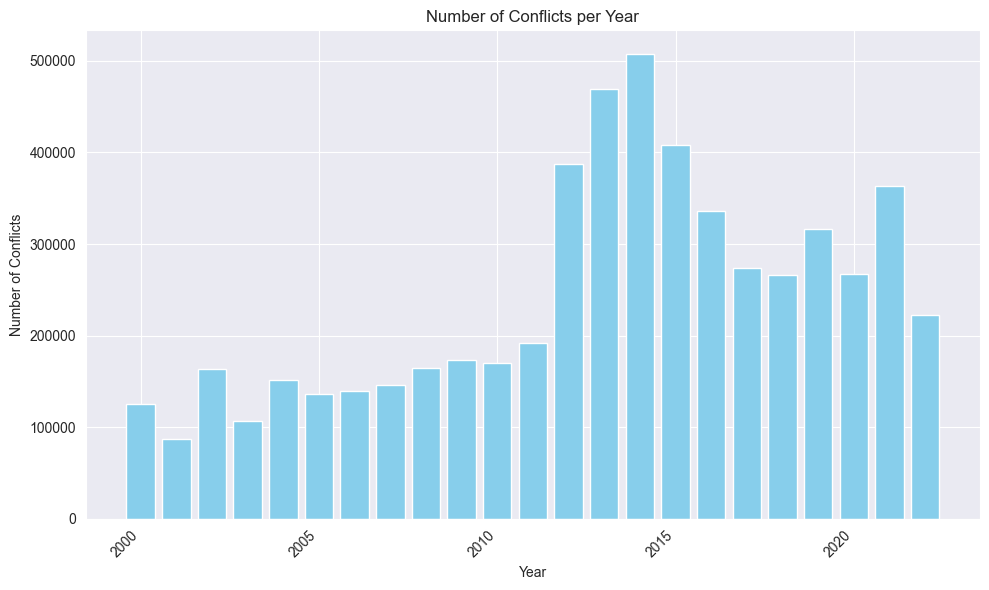

In [11]:
import matplotlib.pyplot as plt
# Count conflicts per year
conflict_counts_per_year = datos['year'].value_counts()

# Sort conflict counts in descending order
conflict_counts_per_year = conflict_counts_per_year.sort_values(ascending=False)

# Create the bar chart
plt.figure(figsize=(10, 6))  # Adjust figure size as needed
plt.bar(conflict_counts_per_year.index, conflict_counts_per_year.values, color='skyblue')
plt.xlabel('Year')
plt.ylabel('Number of Conflicts')
plt.title('Number of Conflicts per Year')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Show the plot
plt.tight_layout()
plt.show()

In [13]:
# Sort conflict counts in descending order
conflict_counts_per_year = conflict_counts_per_year.sort_values(ascending=False)

# Get the two years with the most conflicts
top_2_years = conflict_counts_per_year.index[:5].tolist()  # Get the first two indexes

# Print the two years with the most conflicts
print("Los dos años con más conflictos:")
for year in top_2_years:
    conflict_count = conflict_counts_per_year[year]
    print(f"- {year}: {conflict_count} conflictos")

Los dos años con más conflictos:
- 2014: 507854 conflictos
- 2013: 469588 conflictos
- 2015: 408033 conflictos
- 2012: 387068 conflictos
- 2021: 363683 conflictos


In [9]:

import pandas as pd
from folium import Map
from folium import plugins
# Define function to create heatmap for a specific year
def create_heatmap_for_year(year):
    # Filter data for the given year
    data_for_year = datos[datos['year'] == year]

    # Extract data for map
    latitud = data_for_year["latitude"]
    longitud = data_for_year["longitude"]
    muertes_civiles = data_for_year["deaths_civilians"]

    # Create Folium Map (centered at average coordinates)
    mapa = Map(location=[data_for_year['latitude'].mean(), data_for_year['longitude'].mean()], zoom_start=4)

    # Prepare heatmap data (using data for the year)
    heatmap_data = list(zip(latitud, longitud, muertes_civiles))

    # Create Heatmap with tooltip
    tooltip_text = "<b>Año:</b> {year}<br><b>Muertes:</b> {deaths_civilians}"

    mapa_calor = plugins.HeatMap(data=heatmap_data,
                                 radius=25,
                                 max_val=muertes_civiles.max(),
                                 gradient_colors=['white', 'yellow', 'orange', 'red'],
                                 tooltip=tooltip_text.format(year=year, deaths_civilians=muertes_civiles))
    mapa.add_child(mapa_calor)
    # Save the map
    mapa.save(f"heatmap_conflicts_events_{year}.html")
    return mapa


In [10]:
from IPython.display import display 
mapa = create_heatmap_for_year(2013)
display(mapa)

C:\Users\pablo\AppData\Local\Temp\ipykernel_7588\3566269212.py:23: UserWarning: The `max_val` parameter is no longer necessary. The largest intensity is calculated automatically.
  mapa_calor = plugins.HeatMap(data=heatmap_data,


In [44]:

top_3_years = conflict_counts_per_year.index[:4].tolist() 

top_3_years# Get the first two indexes


[2014, 2013, 2015, 2012]

In [15]:

from functions import create_heatmap
df_eventos = eventsData.rename(columns={'conflict_dset_id': 'conflict_id'})
# Unir los DataFrames por la columna 'conflict_id'
df_merged = pd.merge(conflictsData, df_eventos, on='conflict_id', how='inner')

# Verificar el DataFrame resultante
df_merged.columns

Index(['conflict_id', 'location', 'side_a_x', 'side_a_Id', 'side_a_2nd',
       'side_b_x', 'side_b_Id', 'side_b_2nd', 'incompatibility',
       'territory_name', 'year_x', 'intensity_level', 'cumulative_intensity',
       'type_of_conflict', 'start_date', 'start_prec', 'start_date2',
       'start_prec2', 'ep_end', 'ep_end_date', 'ep_end_prec', 'gwno_a',
       'gwno_a_2nd', 'gwno_b', 'gwno_b_2nd', 'gwno_loc', 'region_x', 'version',
       'id', 'relid', 'year_y', 'active_year', 'code_status',
       'type_of_violence', 'conflict_new_id', 'conflict_name', 'dyad_dset_id',
       'dyad_new_id', 'dyad_name', 'side_a_dset_id', 'side_a_new_id',
       'side_a_y', 'side_b_dset_id', 'side_b_new_id', 'side_b_y',
       'number_of_sources', 'source_article', 'source_office', 'source_date',
       'source_headline', 'source_original', 'where_prec', 'where_coordinates',
       'where_description', 'adm_1', 'adm_2', 'latitude', 'longitude',
       'geom_wkt', 'priogrid_gid', 'country', 'country_i

In [18]:
df_merged.to_csv('../docs/ucdp_data_conflicts_and_events_2000_2024_FULL.csv', index=False)   

In [20]:
df_merged.shape

(5517264, 76)

In [16]:
df_merged.head()

,conflict_id,location,side_a_x,side_a_Id,side_a_2nd,side_b_x,side_b_Id,side_b_2nd,incompatibility,territory_name,...,date_end,deaths_a,deaths_b,deaths_civilians,deaths_unknown,best,high,low,gwnoa,gwnob
0,11342,India,Government of India,141,NaN,GNLA,1163,NaN,1,Garoland,...,2009-08-09T00:00:00,4,10,0,0,14,14,14,NaN,NaN
1,11342,India,Government of India,141,NaN,GNLA,1163,NaN,1,Garoland,...,2009-11-15T00:00:00,1,0,0,0,1,1,1,NaN,NaN
2,11342,India,Government of India,141,NaN,GNLA,1163,NaN,1,Garoland,...,2009-07-04T00:00:00,0,0,0,16,16,16,16,NaN,NaN
3,11342,India,Government of India,141,NaN,GNLA,1163,NaN,1,Garoland,...,2009-07-14T00:00:00,3,15,0,0,18,18,18,NaN,NaN
4,11342,India,Government of India,141,NaN,GNLA,1163,NaN,1,Garoland,...,2009-10-03T00:00:00,1,0,0,0,1,1,1,NaN,NaN


In [21]:
selected_columns = df_merged[['conflict_id','conflict_name', 'date_start', 'date_end', 'best', 'deaths_civilians','deaths_unknown','type_of_violence','country', 'region_x']]
selected_columns.head()

,conflict_id,conflict_name,date_start,date_end,best,deaths_civilians,deaths_unknown,type_of_violence,country,region_x
0,11342,Lashkar of Mohmand tribe - TTP,2009-08-09T00:00:00,2009-08-09T00:00:00,14,0,0,2,Pakistan,3
1,11342,Lashkar of Mohmand tribe - TTP,2009-11-15T00:00:00,2009-11-15T00:00:00,1,0,0,2,Pakistan,3
2,11342,Lashkar of Mohmand tribe - TTP,2009-07-04T00:00:00,2009-07-04T00:00:00,16,0,16,2,Pakistan,3
3,11342,Lashkar of Mohmand tribe - TTP,2009-07-14T00:00:00,2009-07-14T00:00:00,18,0,0,2,Pakistan,3
4,11342,Lashkar of Mohmand tribe - TTP,2009-10-03T00:00:00,2009-10-03T00:00:00,1,0,0,2,Pakistan,3


# Get initial conflict data filtered

In [23]:

selected_columns = selected_columns.sort_values(by='date_start')
selected_columns.to_csv('../docs/conflicts_events_FULL_filtered.csv', index=False)
selected_columns.head()

,conflict_id,conflict_name,date_start,date_end,best,deaths_civilians,deaths_unknown,type_of_violence,country,region_x
3027913,329,Ethiopia: Ogaden,2000-01-01T00:00:00,2000-01-23T00:00:00,0,0,0,1,Ethiopia,4
5414467,409,Eritrea - Ethiopia,2000-01-01T00:00:00,2000-06-18T00:00:00,48183,0,48183,1,Ethiopia,4
4871667,352,Sri Lanka (Ceylon): Eelam,2000-01-01T00:00:00,2000-01-01T00:00:00,63,0,0,1,Sri Lanka,3
3015293,327,Angola: Government,2000-01-01T00:00:00,2000-12-31T00:00:00,596,0,596,1,Angola,4
3031323,329,Ethiopia: Ogaden,2000-01-01T00:00:00,2000-01-23T00:00:00,0,0,0,1,Ethiopia,4


In [24]:
df_merged.describe()

,conflict_id,incompatibility,year_x,intensity_level,cumulative_intensity,type_of_conflict,start_prec,start_prec2,ep_end,ep_end_prec,...,event_clarity,date_prec,deaths_a,deaths_b,deaths_civilians,deaths_unknown,best,high,low,gwnob
count,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,0.0,...,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,5.517264e+06,27725.000000
mean,6.712921e+02,1.750931e+00,1.999114e+03,1.525420e+00,8.890771e-01,3.378281e+00,2.923012e+00,1.765493e+00,6.694278e-02,NaN,...,1.090623e+00,1.191328e+00,1.445484e+00,2.761214e+00,1.140080e+00,9.150322e-01,6.261810e+00,7.910367e+00,5.924867e+00,699.863192
std,2.155841e+03,4.345621e-01,1.781678e+01,4.993534e-01,3.140367e-01,4.962111e-01,2.287665e+00,1.452775e+00,2.499229e-01,NaN,...,2.870717e-01,5.126483e-01,4.286608e+01,1.992026e+01,8.333316e+00,1.543954e+02,1.638962e+02,1.697508e+02,1.638417e+02,149.442258
min,2.050000e+02,1.000000e+00,1.946000e+03,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,NaN,...,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,369.000000
25%,2.890000e+02,2.000000e+00,1.986000e+03,1.000000e+00,1.000000e+00,3.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,NaN,...,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,770.000000
50%,3.090000e+02,2.000000e+00,2.003000e+03,2.000000e+00,1.000000e+00,3.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,NaN,...,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.000000e+00,3.000000e+00,2.000000e+00,770.000000
75%,3.330000e+02,2.000000e+00,2.014000e+03,2.000000e+00,1.000000e+00,4.000000e+00,6.000000e+00,1.000000e+00,0.000000e+00,NaN,...,1.000000e+00,1.000000e+00,1.000000e+00,2.000000e+00,0.000000e+00,0.000000e+00,5.000000e+00,6.000000e+00,5.000000e+00,770.000000
max,1.543800e+04,3.000000e+00,2.022000e+03,2.000000e+00,1.000000e+00,4.000000e+00,6.000000e+00,6.000000e+00,1.000000e+00,NaN,...,2.000000e+00,5.000000e+00,1.416200e+04,6.916000e+03,5.964000e+03,7.534000e+04,7.534000e+04,7.425600e+04,7.548200e+04,800.000000


In [25]:
df_eventos[df_eventos["conflict_id"]==364].count()

id                   5800
relid                5800
year                 5800
active_year          5800
code_status          5800
type_of_violence     5800
conflict_id          5800
conflict_new_id      5800
conflict_name        5800
dyad_dset_id         5800
dyad_new_id          5800
dyad_name            5800
side_a_dset_id       5800
side_a_new_id        5800
side_a               5800
side_b_dset_id       5800
side_b_new_id        5800
side_b               5800
number_of_sources    5800
source_article       5800
source_office        3649
source_date          3649
source_headline      3649
source_original      5346
where_prec           5800
where_coordinates    5800
where_description    5715
adm_1                5768
adm_2                5522
latitude             5800
longitude            5800
geom_wkt             5800
priogrid_gid         5800
country              5800
country_id           5800
region               5800
event_clarity        5800
date_prec            5800
date_start  

In [33]:

data = pd.read_csv('../docs/conflicts_events_FULL_filtered.csv', low_memory=False)
conteo_conflictos = data['conflict_id'].value_counts().reset_index()
conteo_conflictos.columns = ['conflict_id', 'conflict_count']
data = data.merge(conteo_conflictos, on='conflict_id')


In [34]:
data_simplified = data.groupby('conflict_id').agg({    
    'conflict_name': 'first',    
    'conflict_count': 'first',
    'date_start': 'first',
    'date_end': 'last',
    'best': 'sum',
    'deaths_civilians': 'sum',
    'type_of_violence': 'max',
    'country': 'first',
    'region_x': 'first',
}).reset_index()

data_simplified.head()

,conflict_id,conflict_name,conflict_count,date_start,date_end,best,deaths_civilians,type_of_violence,country,region_x
0,205,Iran: Kurdistan,817,2016-05-03T00:00:00,2022-11-21T00:00:00,2489,171,1,Iran,2
1,208,PIJ - Civilians,328,2000-11-02T00:00:00,2021-12-16T00:00:00,1224,1160,3,Israel,3
2,209,Philippines: Government,102358,2000-02-02T00:00:00,2022-11-30T00:00:00,298107,30378,3,Philippines,3
3,211,AMB - Civilians,72,2000-12-31T00:00:00,2006-08-13T00:00:00,164,163,3,Israel,1
4,218,India - Pakistan,22248,2000-01-01T00:00:00,2021-02-03T00:00:00,43308,22518,1,Pakistan,3


In [35]:
data_simplified.shape

(174, 10)

In [36]:
print("Número de filas de todos los datos simplificados:", data_simplified.shape[0])

Número de filas de todos los datos simplificados: 174


In [37]:
data_simplified.sort_values(by=['conflict_count'], ascending=[ False]).head(10)

,conflict_id,conflict_name,conflict_count,date_start,date_end,best,deaths_civilians,type_of_violence,country,region_x
55,333,Afghanistan: Government,1623465,2000-01-02T00:00:00,2022-12-31T00:00:00,10490805,629235,1,Afghanistan,3
35,299,Syria: Government,1108111,2011-07-30T00:00:00,2022-12-31T00:00:00,4842671,1424464,1,Syria,2
13,234,Israel: Palestine,516516,2000-03-02T00:00:00,2022-12-30T00:00:00,3083454,2584296,3,Israel,2
30,289,Colombia: Government,256012,2000-01-04T00:00:00,2022-12-06T00:00:00,849874,39034,1,Colombia,5
17,259,Iraq: Government,196448,2003-12-12T00:00:00,2022-12-28T00:00:00,2173536,318560,1,Iraq,2
70,364,India: Kashmir,191400,2000-01-01T00:00:00,2022-12-28T00:00:00,450483,20262,1,India,3
57,337,Somalia: Government,159357,2001-05-11T00:00:00,2022-12-31T00:00:00,1001121,131769,1,Somalia,4
10,230,Yemen (North Yemen): Government,111216,2009-11-03T00:00:00,2022-12-30T00:00:00,1645140,192220,1,Yemen (North Yemen),2
2,209,Philippines: Government,102358,2000-02-02T00:00:00,2022-11-30T00:00:00,298107,30378,3,Philippines,3
65,354,Turkey: Kurdistan,101308,2000-03-02T00:00:00,2022-12-26T00:00:00,367802,13034,1,Turkey,2


## PLOT Number of conflicts by country


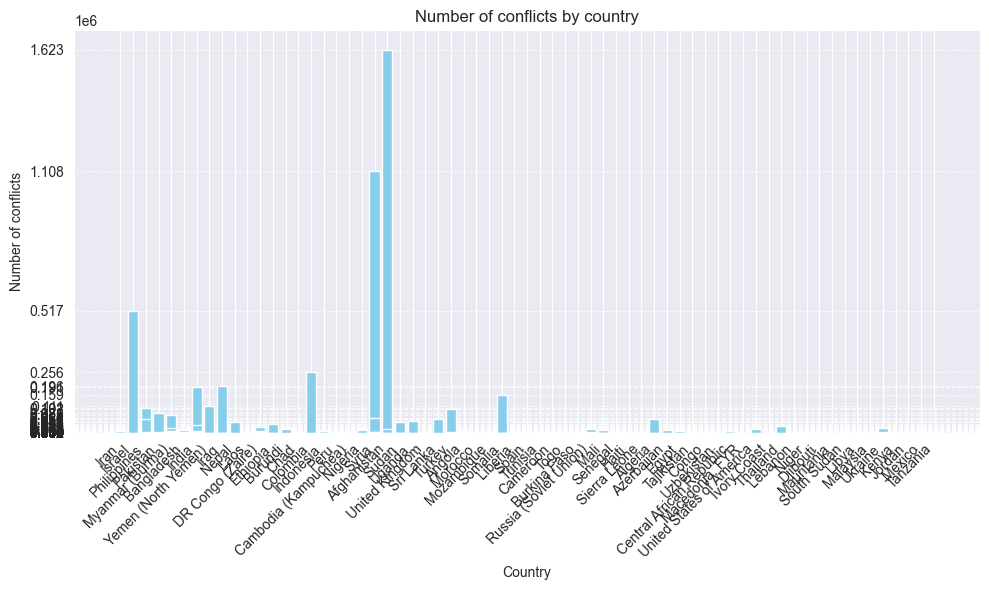

NameError: name 'mpld3' is not defined

In [38]:
import mpld3

plt.figure(figsize=(10, 6))
plt.bar(data_simplified['country'], data_simplified['conflict_count'], color='skyblue')
plt.title('Number of conflicts by country')
plt.xlabel('Country')
plt.ylabel('Number of conflicts')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
# Establecer manualmente las etiquetas del eje y
plt.yticks(data_simplified['conflict_count'])

# Mostrar la gráfica
plt.tight_layout()
plt.show()
html_output = mpld3.fig_to_html(plt.gcf())

# Guardar el HTML en un archivo
with open('html/01_conflictos_por_pais.html', 'w') as file:
    file.write(html_output)

# Number of conflicts in the Middle East by country

In [230]:
import pandas as pd

data = pd.read_csv('../docs/conflicts_events_FULL_filtered.csv', low_memory=False)
paises_oriente_proximo = ['Iran', 'Israel', 'Pakistan', 'Iraq', 'Turkey', 'Syria', 'Jordan']
data_oriente_proximo = data[data['country'].isin(paises_oriente_proximo)]
data = data_oriente_proximo 

data.head(15151)

,conflict_id,conflict_name,date_start,date_end,best,deaths_civilians,deaths_unknown,type_of_violence,country,region_x
33,218,India - Pakistan,2000-01-01T00:00:00,2000-01-02T00:00:00,1,1,0,1,Pakistan,3
35,218,India - Pakistan,2000-01-01T00:00:00,2000-01-02T00:00:00,1,1,0,1,Pakistan,3
123,218,India - Pakistan,2000-01-01T00:00:00,2000-01-02T00:00:00,1,1,0,1,Pakistan,3
167,218,India - Pakistan,2000-01-01T00:00:00,2000-01-02T00:00:00,1,1,0,1,Pakistan,3
192,218,India - Pakistan,2000-01-01T00:00:00,2000-01-02T00:00:00,1,1,0,1,Pakistan,3
...,...,...,...,...,...,...,...,...,...,...
195967,234,Israel: Palestine,2001-10-31T00:00:00,2001-10-31T00:00:00,2,0,0,1,Israel,2
195969,234,Israel: Palestine,2001-10-31T00:00:00,2001-10-31T00:00:00,2,0,0,1,Israel,2
195970,234,Israel: Palestine,2001-10-31T00:00:00,2001-10-31T00:00:00,2,0,0,1,Israel,2
195974,234,Israel: Palestine,2001-10-31T00:00:00,2001-10-31T00:00:00,2,0,0,1,Israel,2


In [175]:
data.columns

Index(['conflict_id', 'conflict_name', 'date_start', 'date_end', 'best',
       'deaths_civilians', 'deaths_unknown', 'type_of_violence', 'country',
       'region_x'],
      dtype='object')

#check no date with data

In [231]:
import pandas as pd

# Definir el rango de fechas completo que cubre todo el período de interés
min_date = data['date_start'].min()
max_date = data['date_start'].max()
date_range_complete = pd.date_range(start=min_date, end=max_date)

# Suponiendo que 'data' es tu DataFrame conflict_counts_by_day
present_dates = pd.to_datetime(data['date_start'])

# Formatear las fechas al formato especificado
present_dates = present_dates.dt.strftime('%Y-%m-%dT%H:%M:%S')
# Encontrar las fechas que faltan en el rango completo
missing_dates = date_range_complete[~date_range_complete.isin(present_dates)]

# Si hay fechas que faltan, entonces hay intervalos vacíos
if not missing_dates.empty:
    print("Intervalos vacíos:")
    for start_date, end_date in zip(missing_dates, missing_dates[1:]):
        print(f"Desde {start_date} hasta {end_date}")
else:
    print("No hay intervalos vacíos.")


Intervalos vacíos:
Desde 2000-01-02 00:00:00 hasta 2000-01-03 00:00:00
Desde 2000-01-03 00:00:00 hasta 2000-01-04 00:00:00
Desde 2000-01-04 00:00:00 hasta 2000-01-05 00:00:00
Desde 2000-01-05 00:00:00 hasta 2000-01-06 00:00:00
Desde 2000-01-06 00:00:00 hasta 2000-01-07 00:00:00
Desde 2000-01-07 00:00:00 hasta 2000-01-08 00:00:00
Desde 2000-01-08 00:00:00 hasta 2000-01-10 00:00:00
Desde 2000-01-10 00:00:00 hasta 2000-01-11 00:00:00
Desde 2000-01-11 00:00:00 hasta 2000-01-13 00:00:00
Desde 2000-01-13 00:00:00 hasta 2000-01-14 00:00:00
Desde 2000-01-14 00:00:00 hasta 2000-01-15 00:00:00
Desde 2000-01-15 00:00:00 hasta 2000-01-16 00:00:00
Desde 2000-01-16 00:00:00 hasta 2000-01-17 00:00:00
Desde 2000-01-17 00:00:00 hasta 2000-01-18 00:00:00
Desde 2000-01-18 00:00:00 hasta 2000-01-19 00:00:00
Desde 2000-01-19 00:00:00 hasta 2000-01-20 00:00:00
Desde 2000-01-20 00:00:00 hasta 2000-01-21 00:00:00
Desde 2000-01-21 00:00:00 hasta 2000-01-23 00:00:00
Desde 2000-01-23 00:00:00 hasta 2000-01-24 00

In [232]:
data.columns

Index(['conflict_id', 'conflict_name', 'date_start', 'date_end', 'best',
       'deaths_civilians', 'deaths_unknown', 'type_of_violence', 'country',
       'region_x'],
      dtype='object')

# Number total of conflicts in the Middle East by country

In [209]:
import pandas as pd

# Suponiendo que data ya está filtrado por países del Medio Oriente
# Si no, asegúrate de que data contenga solo los datos relevantes

# Convertir las fechas a tipo datetime si aún no lo están
data['date_start'] = pd.to_datetime(data['date_start'])
data['date_start']=data['date_start'].dt.strftime('%Y-%m-%dT%H:%M:%S')
# Agregar las columnas requeridas al DataFrame data
data['best'] = data['best'].astype(int)  # Convierte 'best' a tipo int si es necesario
data['deaths_civilians'] = data['deaths_civilians'].astype(int)  # Convierte 'deaths_civilians' a tipo int si es necesario
data['deaths_unknown'] = data['deaths_unknown'].astype(int)  # Convierte 'deaths_unknown' a tipo int si es necesario
data['type_of_violence'] = data['type_of_violence'].astype(int)  # Convierte 'type_of_violence' a tipo int si es necesario

# Agrupar por día y agregar las columnas deseadas
conflict_counts_by_day = data.groupby(data['date_start']).agg({
    'best': 'max',
    'deaths_civilians': 'sum',
    'deaths_unknown': 'sum',
    'type_of_violence': 'max'
}).reset_index()

# Ordenar por fecha de inicio
conflict_counts_by_day = conflict_counts_by_day.sort_values(by='date_start')

# Mostrar los primeros registros
print(conflict_counts_by_day.head(151515))


               date_start  best  deaths_civilians  deaths_unknown  \
0     2000-01-01T00:00:00     1                27               0   
1     2000-01-09T00:00:00    12                 0              72   
2     2000-01-12T00:00:00     1                 0               0   
3     2000-01-22T00:00:00     3                81               0   
4     2000-01-27T00:00:00     1                27               0   
...                   ...   ...               ...             ...   
7174  2022-12-27T00:00:00     3                17               0   
7175  2022-12-28T00:00:00    10                 0               0   
7176  2022-12-29T00:00:00     5                 0               0   
7177  2022-12-30T00:00:00    12               792               0   
7178  2022-12-31T00:00:00     5                 0               0   

      type_of_violence  
0                    1  
1                    1  
2                    1  
3                    1  
4                    1  
...                ..

In [210]:
conflict_counts_by_day.shape

(7179, 5)

In [211]:
conflict_counts_by_day.head()

,date_start,best,deaths_civilians,deaths_unknown,type_of_violence
0,2000-01-01T00:00:00,1,27,0,1
1,2000-01-09T00:00:00,12,0,72,1
2,2000-01-12T00:00:00,1,0,0,1
3,2000-01-22T00:00:00,3,81,0,1
4,2000-01-27T00:00:00,1,27,0,1


In [214]:
# Contar el número de filas por fecha en la columna 'date_start' y asignar un nombre específico a la columna
conflict_counts = data.groupby('date_start').size().reset_index(name='conflicts_count')

print(conflict_counts)


               date_start  conflicts_count
0     2000-01-01T00:00:00               27
1     2000-01-09T00:00:00               30
2     2000-01-12T00:00:00               24
3     2000-01-22T00:00:00               27
4     2000-01-27T00:00:00               27
...                   ...              ...
7174  2022-12-27T00:00:00               51
7175  2022-12-28T00:00:00               66
7176  2022-12-29T00:00:00               37
7177  2022-12-30T00:00:00               76
7178  2022-12-31T00:00:00               57

[7179 rows x 2 columns]


In [182]:
conflict_counts.shape

(7179, 2)

In [216]:
import pandas as pd
import numpy as np

# Asegúrate de que las columnas 'date_start' sean del tipo datetime
conflict_counts_by_day['date_start'] = pd.to_datetime(conflict_counts_by_day['date_start'])
conflict_counts['date_start'] = pd.to_datetime(conflict_counts['date_start'])

# Paso 1: Crea un DataFrame con un rango de fechas diarias
date_range = pd.date_range(start=conflict_counts_by_day['date_start'].min(), end=conflict_counts_by_day['date_start'].max(), freq='D')
date_range_df = pd.DataFrame({'date_start': date_range})

# Paso 2: Fusiona el DataFrame de rango de fechas con tu DataFrame original usando 'left' join para mantener todas las fechas del rango
merged_data = pd.merge(date_range_df, conflict_counts_by_day, on='date_start', how='left')
merged_data = pd.merge(merged_data, conflict_counts, on='date_start', how='left')

# Paso 3: Rellenar los valores nulos con 0
merged_data_filled = merged_data.fillna(0)

# Visualizar los primeros 20 registros del DataFrame resultante
print(merged_data_filled.head(20))

# Filtrar las filas que contienen valores nulos (para verificar que no hay nulos)
rows_with_nulls = merged_data_filled[merged_data_filled.isnull().any(axis=1)]
print("Filas con valores nulos después de rellenar:")
print(rows_with_nulls)


   date_start  conflicts_count       best  deaths_civilians  deaths_unknown  \
0  2000-01-01           27.000   1.000000            27.000             0.0   
1  2000-01-02           27.375   2.375000            23.625             9.0   
2  2000-01-03           27.750   3.750000            20.250            18.0   
3  2000-01-04           28.125   5.125000            16.875            27.0   
4  2000-01-05           28.500   6.500000            13.500            36.0   
5  2000-01-06           28.875   7.875000            10.125            45.0   
6  2000-01-07           29.250   9.250000             6.750            54.0   
7  2000-01-08           29.625  10.625000             3.375            63.0   
8  2000-01-09           30.000  12.000000             0.000            72.0   
9  2000-01-10           28.000   8.333333             0.000            48.0   
10 2000-01-11           26.000   4.666667             0.000            24.0   
11 2000-01-12           24.000   1.000000           

In [220]:
merged_data_interpolated.head(151515)

,date_start,conflicts_count,best,deaths_civilians,deaths_unknown,type_of_violence
0,2000-01-01,27.000,1.000,27.000,0.0,1.0
1,2000-01-02,27.375,2.375,23.625,9.0,1.0
2,2000-01-03,27.750,3.750,20.250,18.0,1.0
3,2000-01-04,28.125,5.125,16.875,27.0,1.0
4,2000-01-05,28.500,6.500,13.500,36.0,1.0
...,...,...,...,...,...,...
8396,2022-12-27,51.000,3.000,17.000,0.0,1.0
8397,2022-12-28,66.000,10.000,0.000,0.0,1.0
8398,2022-12-29,37.000,5.000,0.000,0.0,1.0
8399,2022-12-30,76.000,12.000,792.000,0.0,3.0


In [221]:
# Filtrar las filas que contienen valores nulos
rows_with_nulls = merged_data_interpolated[merged_data_interpolated.isnull().any(axis=1)]

print(rows_with_nulls)

Empty DataFrame
Columns: [date_start, conflicts_count, best, deaths_civilians, deaths_unknown, type_of_violence]
Index: []


In [222]:
merged_data.shape

(8401, 5)

Number total of conflicts in the Middle East by country paises_oriente_proximo = ['Iran', 'Israel', 'Pakistan', 'Yemen (North Yemen)', 'Iraq', 'Turkey', 'Syria', 'Jordan', 'Lebanon']

In [223]:
merged_data.head()

,conflicts_count,best,deaths_civilians,deaths_unknown,type_of_violence
date_start,,,,,
2000-01-01,27.0,1.0,27.0,0.0,1.0
2000-01-02,NaN,NaN,NaN,NaN,NaN
2000-01-03,NaN,NaN,NaN,NaN,NaN
2000-01-04,NaN,NaN,NaN,NaN,NaN
2000-01-05,NaN,NaN,NaN,NaN,NaN


#Days without conflicts

In [224]:
import pandas as pd

# Eliminar duplicados en la columna 'date_start' si existen
merged_data_unique = merged_data_interpolated.drop_duplicates(subset=['date_start']).copy()

# Convertir la columna 'date_start' al tipo datetime64 si no está en ese formato
merged_data_unique['date_start'] = pd.to_datetime(merged_data_unique['date_start'])


# Encontrar la fecha mínima y máxima después de eliminar duplicados y convertir al formato datetime64
start_date = merged_data_unique['date_start'].min()
end_date = merged_data_unique['date_start'].max()

# Crear un rango de fechas entre la fecha mínima y máxima
all_dates = pd.date_range(start=start_date, end=end_date)

# Crear un DataFrame con todas las fechas
all_dates_df = pd.DataFrame({'date': all_dates})

# Encontrar las fechas que no están en el DataFrame de conflictos
missing_dates = all_dates_df[~all_dates_df['date'].isin(merged_data_unique['date_start'])]

# Mostrar los días sin conflictos
print("Días sin conflictos:")
print(missing_dates['date'])


Días sin conflictos:
Series([], Name: date, dtype: datetime64[ns])


#View number of conflicts on the interval '2011-01-01' - '2014-12-31' on countries: paises_oriente_proximo = ['Iran', 'Israel', 'Pakistan', 'Yemen (North Yemen)', 'Iraq', 'Turkey', 'Syria', 'Jordan', 'Lebanon']

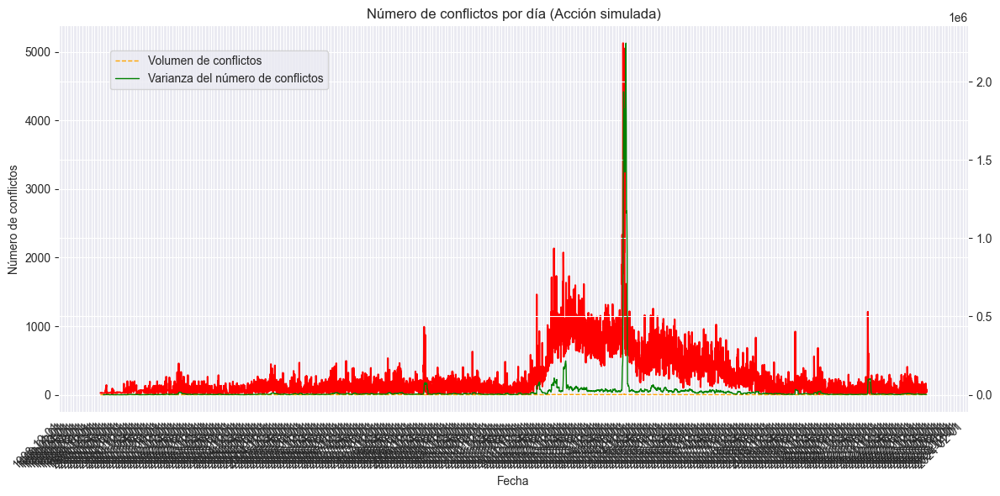

In [227]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

plt.figure(figsize=(12, 6), facecolor='white')

# Gráfico de barras para el número de conflictos por día
plt.plot(merged_data_interpolated['date_start'], merged_data_interpolated['conflicts_count'], color='red', label='Número de conflictos')

# Configuración del eje X
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())

# Configuración del título y las etiquetas
plt.title('Número de conflictos por día (Acción simulada)')
plt.xlabel('Fecha')
plt.ylabel('Número de conflictos')
plt.xticks(rotation=45, ha='right')

# Añadir el volumen de conflictos como una línea secundaria
plt.twinx()
plt.plot(merged_data_interpolated['date_start'], merged_data_interpolated['conflicts_count'], color='orange', linestyle='--', linewidth=1, label='Volumen de conflictos')

# Añadir la varianza del número de conflictos como una línea secundaria
plt.plot(merged_data_interpolated['date_start'], merged_data_interpolated['conflicts_count'].rolling(window=30).var(), color='green', linestyle='-', linewidth=1, label='Varianza del número de conflictos')

# Configurar leyendas
plt.legend(loc='upper left', bbox_to_anchor=(0.05, 0.95))

# Mostrar el gráfico
plt.tight_layout()
plt.show()


#Saving results to csv

In [229]:
from functions import fill_nan_data
merged_data_interpolated['date_start'] = pd.to_datetime(merged_data_interpolated['date_start'])
conflicts_by_day_sorted = fill_nan_data(merged_data_interpolated, pd.to_datetime('2001-01-01'), pd.to_datetime('2023-12-31'),'date_start','conflicts_count')
conflicts_by_day_sorted.to_csv('../docs/conflictsSortedByZone2001-2023.csv', index=False)  